In [8]:
# Installation packages
#!pip install wordcloud
#!pip install tweepy
#!pip install textblob

   ---------------------------------------- 0.0/624.3 kB ? eta -:--:--
   --------------------------------------- 624.3/624.3 kB 24.1 MB/s eta 0:00:00


In [10]:
#Chargement des packages
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
import pandas as pd 
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from textblob import TextBlob
import numpy as np
import plotly.graph_objects as go

## Description des données

In [13]:
# Importation de la base de données
df = pd.read_csv("C:/Users/gusta/Desktop/MASTER_MCAD/vaccination_tweets.csv")
df

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11015,1460932683630977025,theSun,Petaling Jaya,Breaking news updates from the website of Mala...,2009-07-29 01:58:44,151937,465,593,False,2021-11-17 11:27:49,"The number of Covid-19 cases today, 17 Novembe...",NaN,Twitter Web App,2,6,False
11016,1460809350792896516,Sujan,NaN,________________________ •Napricorn• •It's jus...,2013-01-28 11:48:20,4259,622,156941,False,2021-11-17 03:17:44,First dose ✅\n#PfizerBioNTech,['PfizerBioNTech'],Twitter for Android,0,4,False
11017,1460581918295031809,theSun,Petaling Jaya,Breaking news updates from the website of Mala...,2009-07-29 01:58:44,151937,465,593,False,2021-11-16 12:14:00,"The number of Covid-19 cases today, 16 Novembe...",NaN,Twitter Web App,3,5,False
11018,1460344277951782922,Aleksejs Jackovs,Ireland,#Scientificresearcher in #InformationTechnolog...,2012-08-13 13:47:03,1,38,99,False,2021-11-15 20:29:42,#PfizerBioNTech has developed new pill #Paxlov...,"['PfizerBioNTech', 'Paxlovid', 'COVID19']",Twitter Web App,1,1,False


In [15]:
# Informations sur la base de données
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11020 entries, 0 to 11019
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                11020 non-null  int64 
 1   user_name         11020 non-null  object
 2   user_location     8750 non-null   object
 3   user_description  10340 non-null  object
 4   user_created      11020 non-null  object
 5   user_followers    11020 non-null  int64 
 6   user_friends      11020 non-null  int64 
 7   user_favourites   11020 non-null  int64 
 8   user_verified     11020 non-null  bool  
 9   date              11020 non-null  object
 10  text              11020 non-null  object
 11  hashtags          8438 non-null   object
 12  source            11019 non-null  object
 13  retweets          11020 non-null  int64 
 14  favorites         11020 non-null  int64 
 15  is_retweet        11020 non-null  bool  
dtypes: bool(2), int64(6), object(8)
memory usage: 1.2+ MB


In [17]:
#Nombres de valeurs manquantes
df.isnull().sum()

id                     0
user_name              0
user_location       2270
user_description     680
user_created           0
user_followers         0
user_friends           0
user_favourites        0
user_verified          0
date                   0
text                   0
hashtags            2582
source                 1
retweets               0
favorites              0
is_retweet             0
dtype: int64

In [19]:
df = df[['text','date']]
df

,text,date
0,Same folks said daikon paste could treat a cyt...,2020-12-20 06:06:44
1,While the world has been on the wrong side of ...,2020-12-13 16:27:13
2,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,2020-12-12 20:33:45
3,"Facts are immutable, Senator, even when you're...",2020-12-12 20:23:59
4,Explain to me again why we need a vaccine @Bor...,2020-12-12 20:17:19
...,...,...
11015,"The number of Covid-19 cases today, 17 Novembe...",2021-11-17 11:27:49
11016,First dose ✅\n#PfizerBioNTech,2021-11-17 03:17:44
11017,"The number of Covid-19 cases today, 16 Novembe...",2021-11-16 12:14:00
11018,#PfizerBioNTech has developed new pill #Paxlov...,2021-11-15 20:29:42


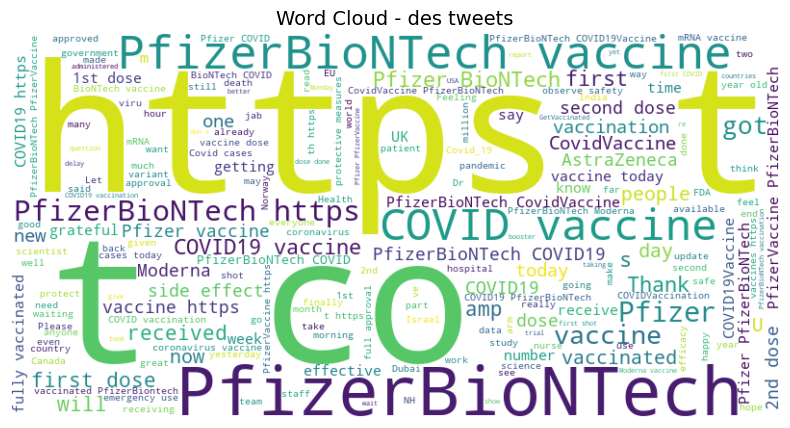

In [21]:
# Fonction pour générer le word cloud
def generer_wordcloud(tweets, titre):
    tout_texte = ' '.join(tweets)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(tout_texte)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(titre, fontsize=14)
    plt.axis('off')
    plt.show()

# Générer le word cloud 
generer_wordcloud(df['text'], 'Word Cloud - des tweets')

## Prétraitement des tweets

In [30]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import TreebankWordTokenizer
from nltk.stem import WordNetLemmatizer

# Télécharger les ressources nécessaires
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Suppression des caractères spéciaux et de la ponctuation
    processed_tweet = re.sub(r"[^\w\s]", "", text)
    
    # Conversion en minuscules
    processed_tweet = processed_tweet.lower()
    
    # Tokenisation du texte avec TreebankWordTokenizer
    tokenizer = TreebankWordTokenizer()
    tokens = tokenizer.tokenize(processed_tweet)
    
    # Suppression des mots vides
    tokens = [word for word in tokens if word not in stop_words]
    
    # Lemmatisation des tokens
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    
    # Joindre les tokens en une seule chaîne
    cleaned_text = ' '.join(tokens)
    
    return cleaned_text

# Appliquer le nettoyage du texte sur la colonne 'texte'
df['texte_nettoye'] = df['text'].apply(clean_text)

df


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\gusta\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gusta\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\gusta\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\gusta\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\15645090.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['texte_nettoye'] 

,text,date,texte_nettoye
0,Same folks said daikon paste could treat a cyt...,2020-12-20 06:06:44,folk said daikon paste could treat cytokine st...
1,While the world has been on the wrong side of ...,2020-12-13 16:27:13,world wrong side history year hopefully bigges...
2,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,2020-12-12 20:33:45,coronavirus sputnikv astrazeneca pfizerbiontec...
3,"Facts are immutable, Senator, even when you're...",2020-12-12 20:23:59,fact immutable senator even youre ethically st...
4,Explain to me again why we need a vaccine @Bor...,2020-12-12 20:17:19,explain need vaccine borisjohnson matthancock ...
...,...,...,...
11015,"The number of Covid-19 cases today, 17 Novembe...",2021-11-17 11:27:49,number covid19 case today 17 november 2021 rem...
11016,First dose ✅\n#PfizerBioNTech,2021-11-17 03:17:44,first dose pfizerbiontech
11017,"The number of Covid-19 cases today, 16 Novembe...",2021-11-16 12:14:00,number covid19 case today 16 november 2021 rem...
11018,#PfizerBioNTech has developed new pill #Paxlov...,2021-11-15 20:29:42,pfizerbiontech developed new pill paxlovid inc...


In [32]:
stop_words

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

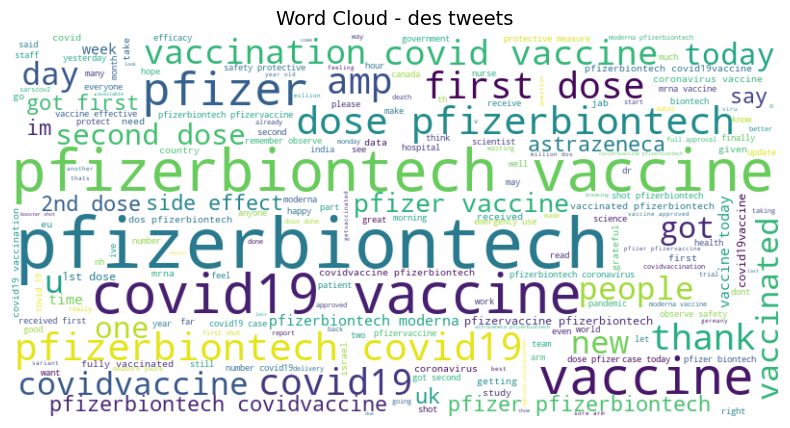

In [34]:
# Générer le word cloud 
generer_wordcloud(df['texte_nettoye'], 'Word Cloud - des tweets')

## Analyse des sentiments

In [37]:
example1=TextBlob("J'adore le NLP")
print(example1.sentiment)

Sentiment(polarity=0.0, subjectivity=0.0)


In [39]:
example2=TextBlob("This situation makes me sad and frustrated.")
print(example2.sentiment)

Sentiment(polarity=-0.6, subjectivity=0.6)


In [41]:
example3=TextBlob("Tomorrow is a new day")
print(example3.sentiment)

Sentiment(polarity=0.13636363636363635, subjectivity=0.45454545454545453)


In [47]:
#!pip install flair
from flair.models import TextClassifier
from flair.data import Sentence

texte = "Je suis content d'apprendre de nouvelles choses"

classifier = TextClassifier.load("sentiment")
sentence = Sentence(texte)

classifier.predict(sentence)

polarite = sentence.labels[0].score
label = sentence.labels[0].value

print("Polarité du sentiment :", polarite)
print("Étiquette du sentiment :", label)

Polarité du sentiment : 0.9991528987884521
Étiquette du sentiment : POSITIVE


In [49]:
# Calcule de la polarité
df['polarity'] = df['texte_nettoye'].apply(lambda x: TextBlob(x).sentiment[0])
df['subjectivity'] = df['texte_nettoye'].apply(lambda x: TextBlob(x).sentiment[1])
# Définir les étiquettes de sentiment en fonction de la polarité
df['Sentiment'] = df['polarity'].apply(lambda x: 'Positif' if x > 0 else ('Négatif' if x < 0 else 'Neutre'))
df

C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\660074019.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['polarity'] = df['texte_nettoye'].apply(lambda x: TextBlob(x).sentiment[0])
C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\660074019.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['subjectivity'] = df['texte_nettoye'].apply(lambda x: TextBlob(x).sentiment[1])
C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\660074019.py:5: SettingWithCopyWarning: 
A value is trying to be set on a co

,text,date,texte_nettoye,polarity,subjectivity,Sentiment
0,Same folks said daikon paste could treat a cyt...,2020-12-20 06:06:44,folk said daikon paste could treat cytokine st...,0.000000,0.000000,Neutre
1,While the world has been on the wrong side of ...,2020-12-13 16:27:13,world wrong side history year hopefully bigges...,-0.500000,0.900000,Négatif
2,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,2020-12-12 20:33:45,coronavirus sputnikv astrazeneca pfizerbiontec...,0.000000,0.033333,Neutre
3,"Facts are immutable, Senator, even when you're...",2020-12-12 20:23:59,fact immutable senator even youre ethically st...,0.100000,0.550000,Positif
4,Explain to me again why we need a vaccine @Bor...,2020-12-12 20:17:19,explain need vaccine borisjohnson matthancock ...,0.000000,0.000000,Neutre
...,...,...,...,...,...,...
11015,"The number of Covid-19 cases today, 17 Novembe...",2021-11-17 11:27:49,number covid19 case today 17 november 2021 rem...,0.000000,0.000000,Neutre
11016,First dose ✅\n#PfizerBioNTech,2021-11-17 03:17:44,first dose pfizerbiontech,0.250000,0.333333,Positif
11017,"The number of Covid-19 cases today, 16 Novembe...",2021-11-16 12:14:00,number covid19 case today 16 november 2021 rem...,0.000000,0.000000,Neutre
11018,#PfizerBioNTech has developed new pill #Paxlov...,2021-11-15 20:29:42,pfizerbiontech developed new pill paxlovid inc...,-0.121212,0.501515,Négatif


In [51]:
# Calculer les statistiques sur la polarité
df['polarity'].describe()

count    11020.000000
mean         0.100568
std          0.232226
min         -1.000000
25%          0.000000
50%          0.000000
75%          0.212946
max          1.000000
Name: polarity, dtype: float64

In [53]:
# Calculer les statistiques sur la subjectivité
df['subjectivity'].describe()

count    11020.000000
mean         0.274878
std          0.303137
min          0.000000
25%          0.000000
50%          0.200000
75%          0.500000
max          1.000000
Name: subjectivity, dtype: float64

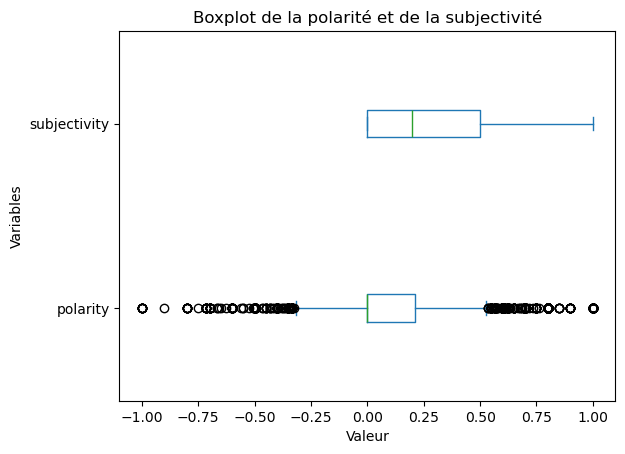

In [55]:
# Tracer le boxplot pour la polarité et la subjectivité
df[['polarity', 'subjectivity']].plot(kind='box', vert=False)

# Ajouter des titres et des étiquettes d'axe
plt.title('Boxplot de la polarité et de la subjectivité')
plt.xlabel('Valeur')
plt.ylabel('Variables')

# Afficher le boxplot
plt.show()

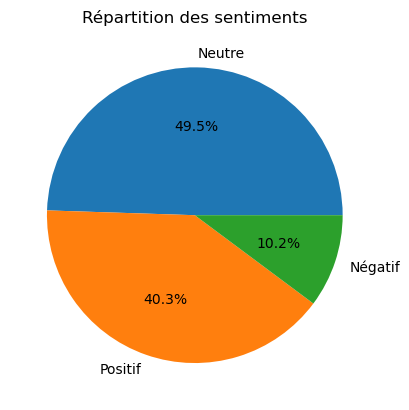

In [57]:
# Compter le nombre de chaque sentiment
sentiment_counts = df['Sentiment'].value_counts()

# Obtenir les étiquettes de sentiment et les valeurs correspondantes
labels = sentiment_counts.index.tolist()
values = sentiment_counts.values.tolist()

# Tracer le diagramme circulaire
plt.pie(values, labels=labels, autopct='%1.1f%%')

# Ajouter un titre
plt.title("Répartition des sentiments")

# Afficher le diagramme circulaire
plt.show()

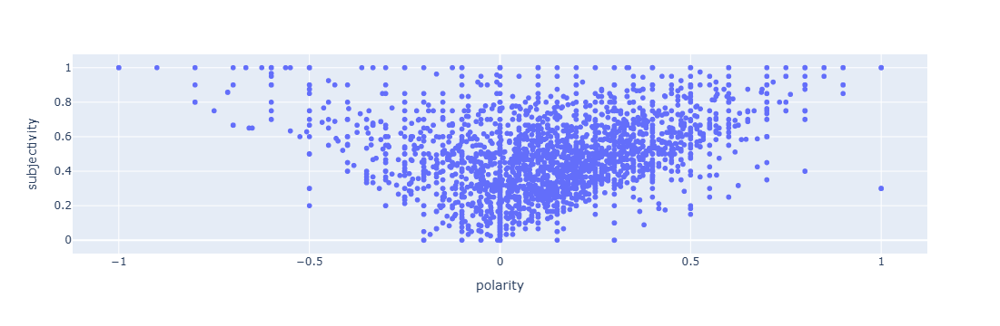

In [59]:
import plotly.express as px
fig = px.scatter(df,x='polarity',y='subjectivity')
fig.show()

C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\481517683.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



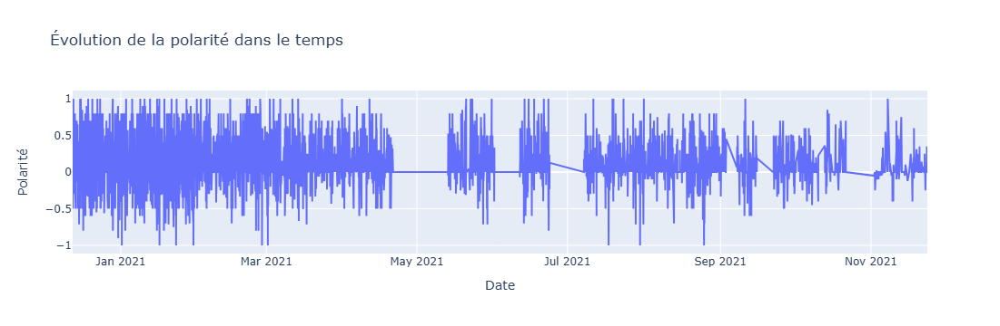

In [61]:
# Convertir la colonne 'Date' en type de données 'datetime'
df['date'] = pd.to_datetime(df['date'])

# Trier le DataFrame par ordre croissant de dates
df = df.sort_values('date')

# Créer la figure
fig = go.Figure()

# Ajouter la trace de ligne pour l'évolution de la polarité dans le temps
fig.add_trace(go.Scatter(x=df['date'], y=df['polarity'], mode='lines', name='Polarité'))

# Mettre en forme le titre et les étiquettes d'axe
fig.update_layout(title='Évolution de la polarité dans le temps',
                  xaxis=dict(title='Date'),
                  yaxis=dict(title='Polarité'))

# Afficher le graphique
fig.show()

In [63]:
import plotly.express as px
# Convertir la colonne 'date' en type datetime
df['date'] = pd.to_datetime(df['date'])

# Enlever les heures de la date
df['date'] = df['date'].dt.date
# Calculer le nombre de tweets par sentiment et par date
df_agg = df.groupby(['date', 'Sentiment']).size().reset_index(name='counts')

df_agg.head()

,date,Sentiment,counts
0,2020-12-12,Neutre,34
1,2020-12-12,Négatif,7
2,2020-12-12,Positif,22
3,2020-12-13,Neutre,50
4,2020-12-13,Négatif,10


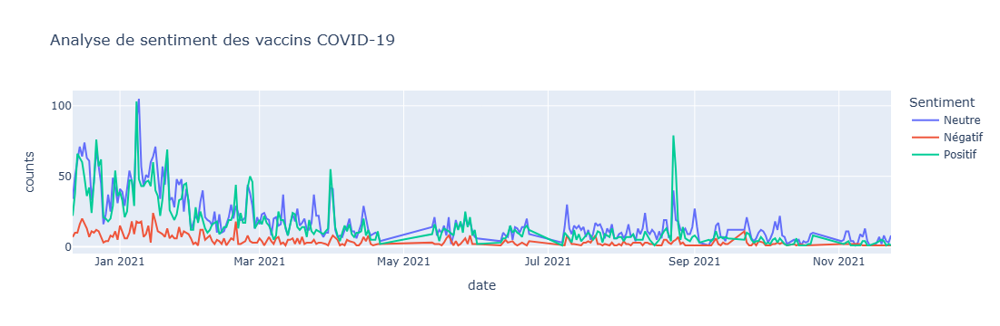

In [65]:
fig = px.line(df_agg, x='date', y='counts', color='Sentiment', title='Analyse de sentiment des vaccins COVID-19')

fig.show()

In [67]:
# Grouper par date et compter le nombre de sentiments positifs, négatifs et neutres
sentiment_counts = df.groupby('date')['Sentiment'].value_counts().unstack().fillna(0)

# Afficher le résultat
print(sentiment_counts)

Sentiment   Neutre  Négatif  Positif
date                                
2020-12-12    34.0      7.0     22.0
2020-12-13    50.0     10.0     38.0
2020-12-14    61.0     10.0     66.0
2020-12-15    71.0     16.0     63.0
2020-12-16    64.0     20.0     60.0
...            ...      ...      ...
2021-11-19     2.0      0.0      5.0
2021-11-20     8.0      0.0      4.0
2021-11-21     4.0      0.0      1.0
2021-11-22     3.0      0.0      2.0
2021-11-23     8.0      1.0      1.0

[282 rows x 3 columns]


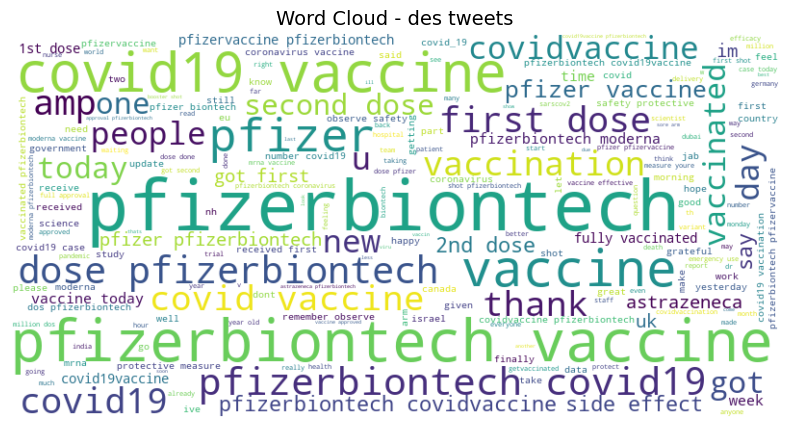

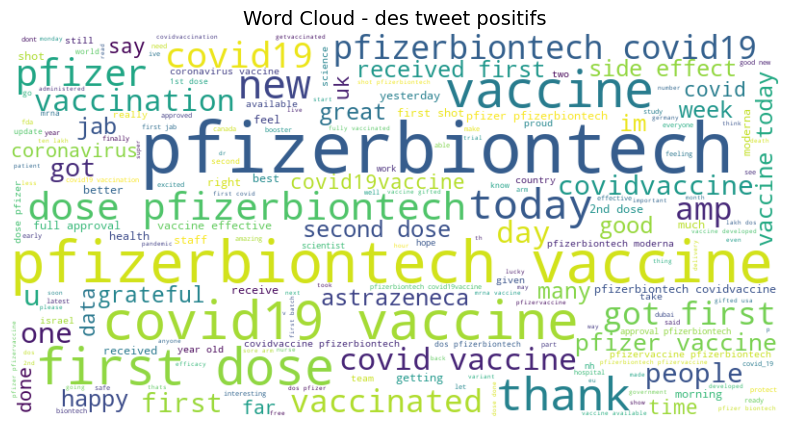

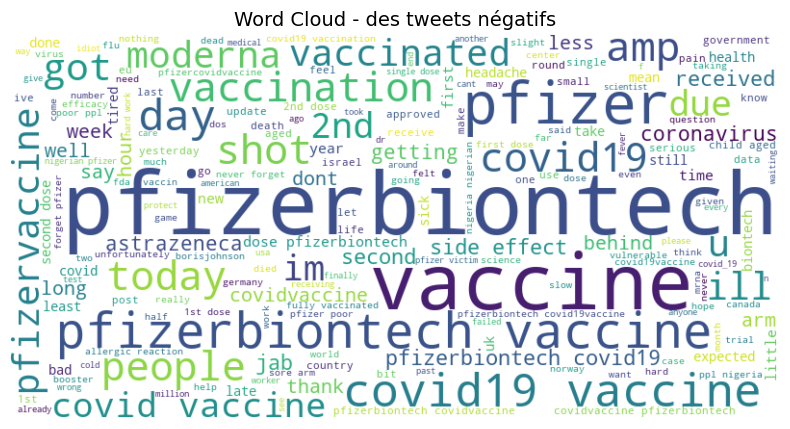

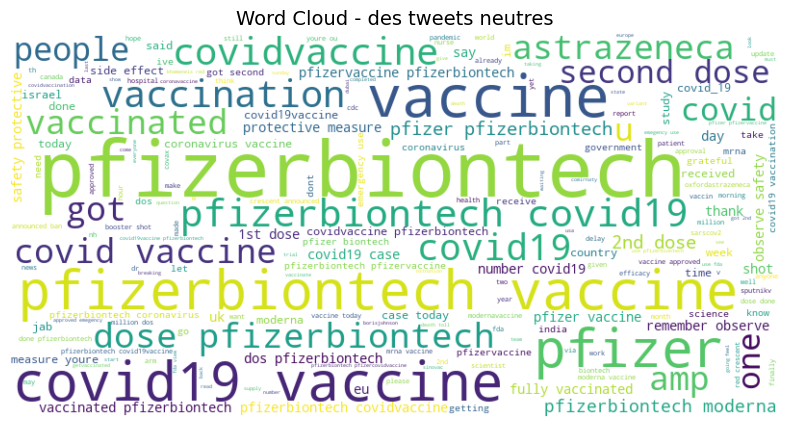

In [69]:
# Générer le word cloud pour chaque type de sentiment
generer_wordcloud(df['texte_nettoye'], 'Word Cloud - des tweets')
# Filtrer les tweets positifs
tweets_positifs = df[df['polarity']>0]['texte_nettoye']
generer_wordcloud(tweets_positifs, 'Word Cloud - des tweet positifs')
# Filtrer les tweets positifs
tweets_negatifs = df[df['polarity'] < 0]['texte_nettoye']
generer_wordcloud(tweets_negatifs, 'Word Cloud - des tweets négatifs')
# Filtrer les tweets positifs
tweets_neutre = df[df['polarity'] ==0]['texte_nettoye']
generer_wordcloud(tweets_neutre, 'Word Cloud - des tweets neutres')

In [71]:
# Breaking down the tweets into words in seperate categories
positive_tokens = [token for line in tweets_positifs for token in line.split()]
negative_tokens = [token for line in tweets_negatifs for token in line.split()]
neutral_tokens = [token for line in tweets_neutre for token in line.split()]

In [73]:
from collections import Counter
# pour obtenir les mots les plus utilisés
def get_maxtoken(tweets, num=30):
  word_tokens = Counter(tweets)
  max_common = word_tokens.most_common(num)
  return dict(max_common)

def token_df_vis(x, title):
  df = pd.DataFrame(get_maxtoken(x).items(),columns=['words','count'])
  fig = px.bar(df,x='words',y='count',title = title)
  fig.show()

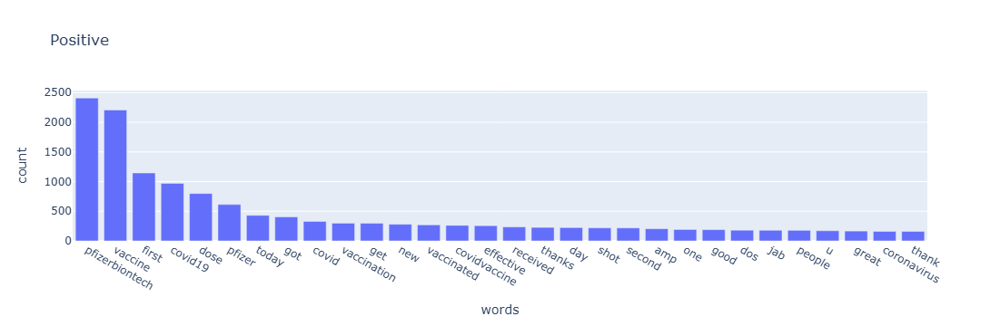

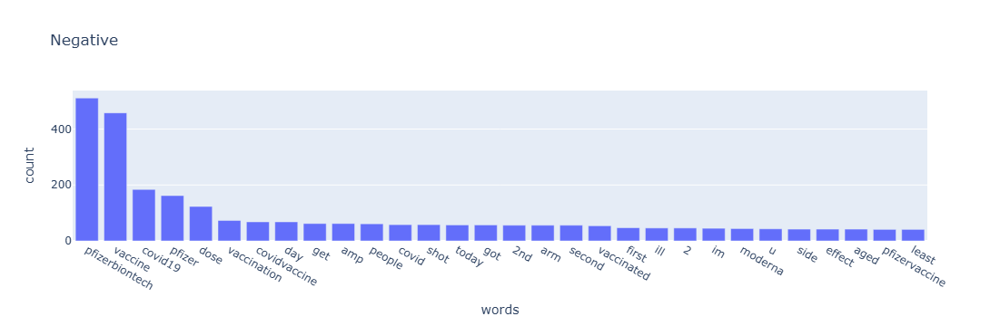

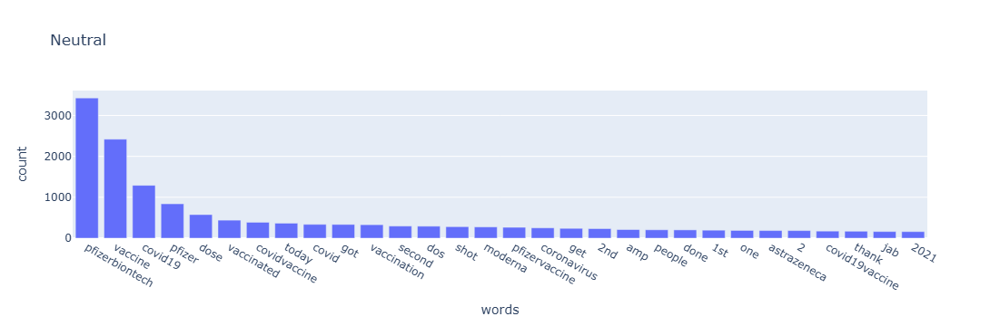

In [75]:
token_df_vis(positive_tokens,'Positive')
token_df_vis(negative_tokens,'Negative')
token_df_vis(neutral_tokens,'Neutral')

## Analyse par type de vaccin

In [78]:
#Création des tags de référence pour 5 vaccins -> Pfizer, Covaxin (Bharat Biotech), Sputnik, AstraZenca (Covishield), Moderna.
pfizer_refs = ["Pfizer","pfizer","Pfizer–BioNTech","pfizer-bioNtech","BioNTech","biontech"]
bbiotech_refs = ["covax","covaxin","Covax","Covaxin","Bharat Biotech","bharat biotech","BharatBiotech","bharatbiotech"]
sputnik_refs = ["russia","sputnik","Sputnik","V"]
astra_refs = ['sii','SII','adar poonawalla','Covishield','covishield','astra','zenca','Oxford–AstraZeneca','astrazenca','oxford-astrazenca','serum institiute']
moderna_refs = ['moderna','Moderna','mRNA-1273','Spikevax']

In [80]:
def refer(tweet, refs):
  flag =0
  for ref in refs:
    if tweet.find(ref) != -1:
      flag =1
  return flag

df['pfizer'] = df['texte_nettoye'].apply(lambda x : refer(x, pfizer_refs))
df['bbiotech'] = df['texte_nettoye'].apply(lambda x : refer(x, bbiotech_refs))
df['sputnik'] = df['texte_nettoye'].apply(lambda x : refer(x, sputnik_refs))
df['astra'] = df['texte_nettoye'].apply(lambda x : refer(x, astra_refs))
df['moderna'] = df['texte_nettoye'].apply(lambda x : refer(x, moderna_refs))
df

,text,date,texte_nettoye,polarity,subjectivity,Sentiment,pfizer,bbiotech,sputnik,astra,moderna
44,#FDA authorizes #PfizerBioNTech #coronavirus v...,2020-12-12,fda authorizes pfizerbiontech coronavirus vacc...,0.000000,0.000000,Neutre,1,0,0,0,0
43,Trump announces #vaccine rollout 'in less than...,2020-12-12,trump announces vaccine rollout less 24 hour f...,0.027778,0.133333,Positif,0,0,0,0,0
42,#CovidVaccine #Pfizer-BioNTech COVID-19 #Pfize...,2020-12-12,covidvaccine pfizerbiontech covid19 pfizerbion...,0.000000,0.000000,Neutre,1,0,0,0,0
41,FACT SHEET FOR RECIPIENTS AND CAREGIVERS\n\n#P...,2020-12-12,fact sheet recipient caregiver pfizerbiontech ...,0.000000,0.000000,Neutre,1,0,0,0,0
40,@mirekR9 @sputnikvaccine @AstraZeneca it's the...,2020-12-12,mirekr9 sputnikvaccine astrazeneca one doesnt ...,0.000000,0.000000,Neutre,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
10963,The expansion is valid for both Moderna and Pf...,2021-11-23,expansion valid moderna pfizerbiontech covid19...,0.000000,0.400000,Neutre,1,0,0,0,1
10962,#Moderna and #PfizerBioNTech \n\nFull report: ...,2021-11-23,moderna pfizerbiontech full report httpstcog6c...,0.350000,0.550000,Positif,1,0,0,0,1
10961,Nothing to see here 👀\n\n#Health #heartattack ...,2021-11-23,nothing see health heartattack myocarditis per...,0.000000,0.000000,Neutre,1,0,0,0,1
10960,#PfizerBiontech #CovidVaccines the effects #M...,2021-11-23,pfizerbiontech covidvaccines effect msm hiding...,0.000000,0.000000,Neutre,1,0,0,0,0


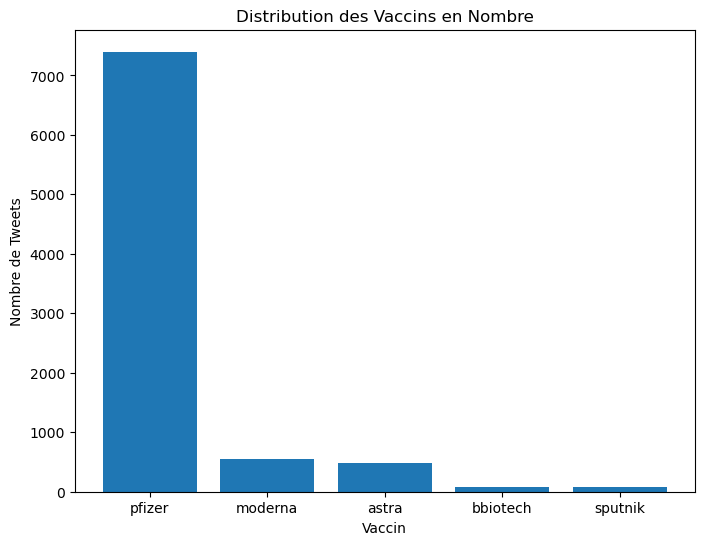

In [82]:
# Liste des noms de vaccins
vaccine_names = ['pfizer', 'moderna', 'astra', 'bbiotech', 'sputnik']

# Calculer la distribution de chaque vaccin en nombre
vaccine_counts = df[vaccine_names].sum()

# Créer un graphique à barres pour la distribution de chaque vaccin
plt.figure(figsize=(8, 6))
plt.bar(vaccine_names, vaccine_counts)
plt.title('Distribution des Vaccins en Nombre')
plt.xlabel('Vaccin')
plt.ylabel('Nombre de Tweets')
plt.show()

In [86]:
# Initialiser un DataFrame vide pour les résultats
results_df = pd.DataFrame(columns=['Vaccin', 'Moyenne Polarity', 'Max Polarity', 'Min Polarity', 'Médiane Polarity',
                                   'Moyenne Subjectivity', 'Max Subjectivity', 'Min Subjectivity', 'Médiane Subjectivity'])
# Liste des noms de vaccins
vaccine_names = ['pfizer', 'moderna', 'astra', 'bbiotech', 'sputnik']

# Parcourir les vaccins
for vaccine in vaccine_names:
    # Filtrer le DataFrame pour le vaccin spécifique
    filtered_df = df[df[vaccine] == 1]
    
    # Calculer les statistiques pour la polarité et la subjectivité
    polarity_stats = filtered_df['polarity'].agg(['mean', 'max', 'min', 'median'])
    subjectivity_stats = filtered_df['subjectivity'].agg(['mean', 'max', 'min', 'median'])
    
    # Créer une nouvelle ligne à ajouter
    new_row = pd.DataFrame({'Vaccin': [vaccine],
                            'Moyenne Polarity': [polarity_stats['mean']],
                            'Max Polarity': [polarity_stats['max']],
                            'Min Polarity': [polarity_stats['min']],
                            'Médiane Polarity': [polarity_stats['median']],
                            'Moyenne Subjectivity': [subjectivity_stats['mean']],
                            'Max Subjectivity': [subjectivity_stats['max']],
                            'Min Subjectivity': [subjectivity_stats['min']],
                            'Médiane Subjectivity': [subjectivity_stats['median']]})
    
    # Utiliser pd.concat pour ajouter la nouvelle ligne
    results_df = pd.concat([results_df, new_row], ignore_index=True)

# Afficher le DataFrame des résultats
results_df


C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\1408400822.py:28: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



,Vaccin,Moyenne Polarity,Max Polarity,Min Polarity,Médiane Polarity,Moyenne Subjectivity,Max Subjectivity,Min Subjectivity,Médiane Subjectivity
0,pfizer,0.099360,1.0,-1.000000,0.0,0.252860,1.0,0.0,0.111111
1,moderna,0.094029,1.0,-0.714286,0.0,0.250713,1.0,0.0,0.000000
2,astra,0.092127,1.0,-0.700000,0.0,0.256679,1.0,0.0,0.100000
3,bbiotech,0.059863,0.8,-0.500000,0.0,0.221396,1.0,0.0,0.000000
4,sputnik,0.011118,1.0,-0.700000,0.0,0.150123,0.9,0.0,0.000000


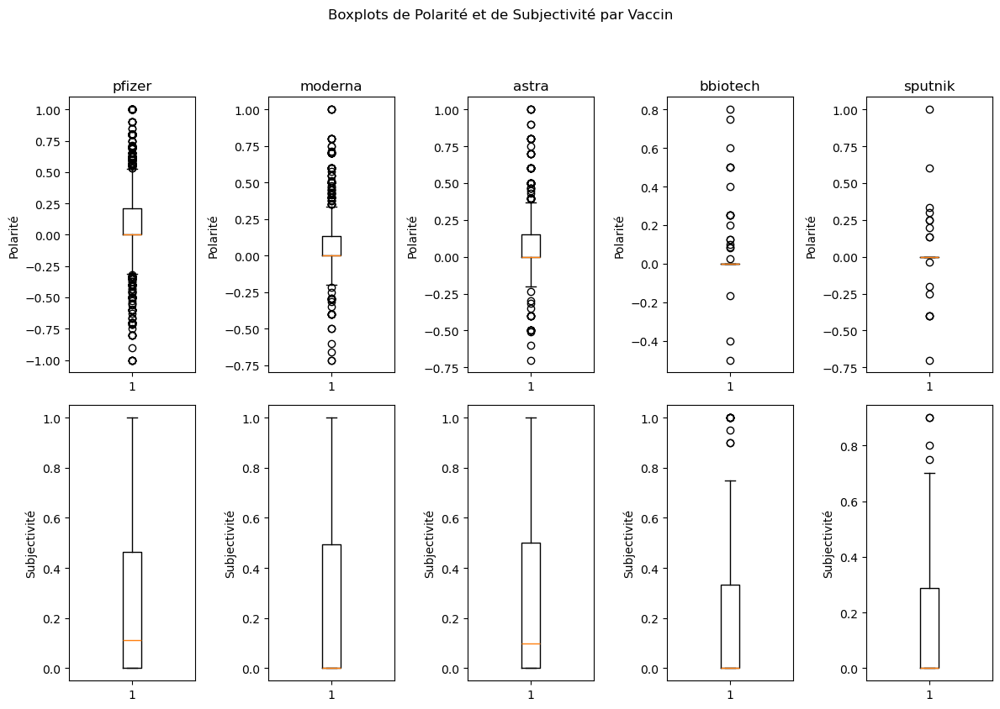

In [88]:
# Création des boxplots pour la polarité et la subjectivité pour chaque vaccin
fig, axes = plt.subplots(nrows=2, ncols=len(vaccine_names), figsize=(12, 8))

for i, vaccine in enumerate(vaccine_names):
    # Boxplot de la polarité pour le vaccin spécifique
    axes[0, i].boxplot(df[df[vaccine] == 1]['polarity'])
    axes[0, i].set_title(vaccine)
    axes[0, i].set_ylabel('Polarité')
    
    # Boxplot de la subjectivité pour le vaccin spécifique
    axes[1, i].boxplot(df[df[vaccine] == 1]['subjectivity'])
    axes[1, i].set_ylabel('Subjectivité')

# Ajouter des titres et ajuster les espacements
fig.suptitle('Boxplots de Polarité et de Subjectivité par Vaccin', y=1.05)
plt.tight_layout()

# Afficher les boxplots
plt.show()

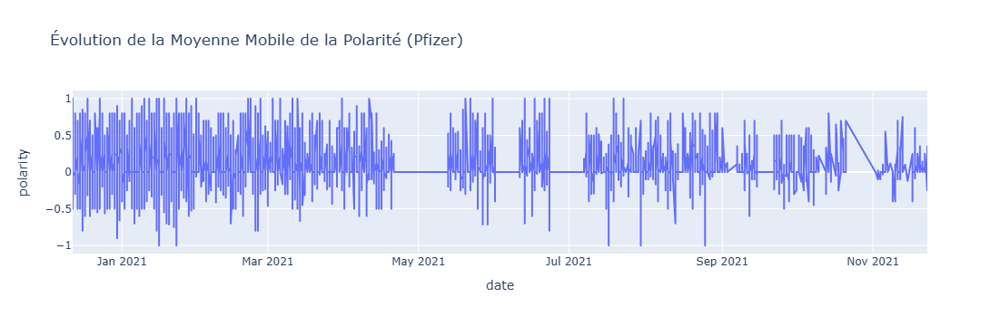

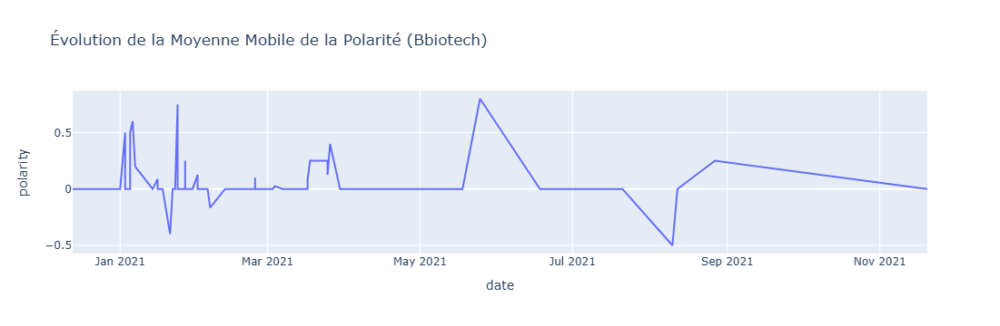

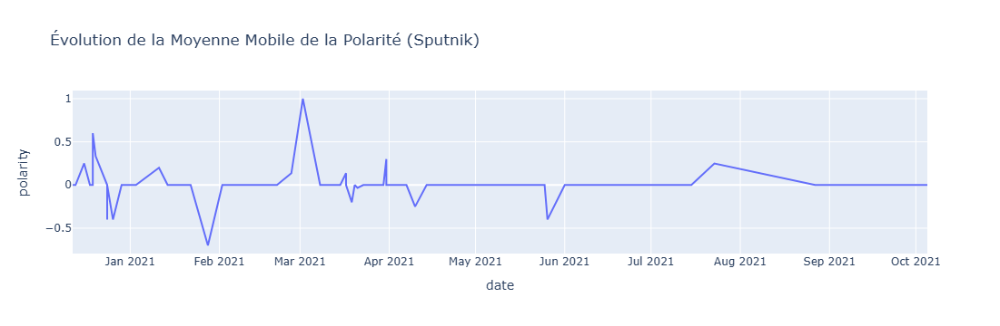

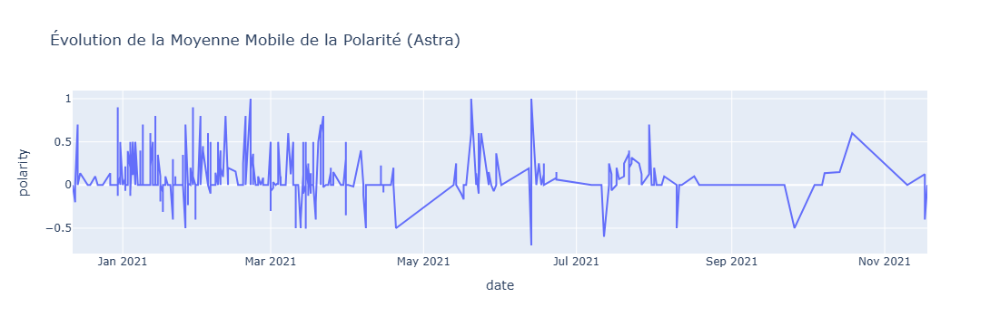

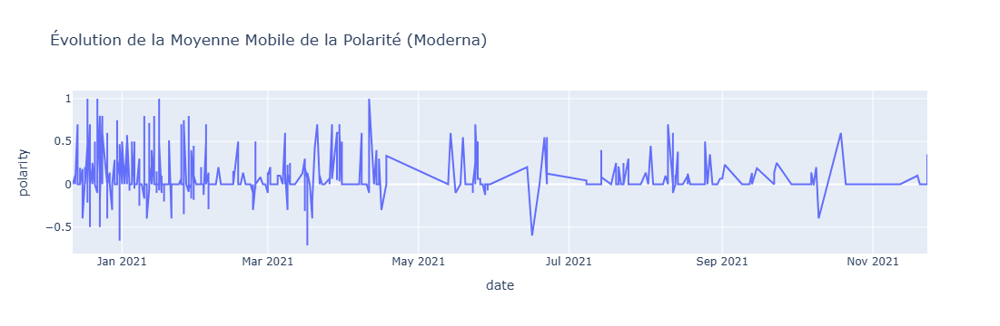

In [90]:
# Liste des noms de vaccins
vaccine_names = ['pfizer', 'bbiotech', 'sputnik', 'astra', 'moderna']

# Créer des graphiques séparés pour l'évolution de la moyenne mobile de la polarité par date pour chaque vaccin
for vaccine in vaccine_names:
    fig = px.line(df[df[vaccine] == 1], x='date', y='polarity', 
                  title=f'Évolution de la Moyenne Mobile de la Polarité ({vaccine.capitalize()})')
    fig.show()

C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\4011864772.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



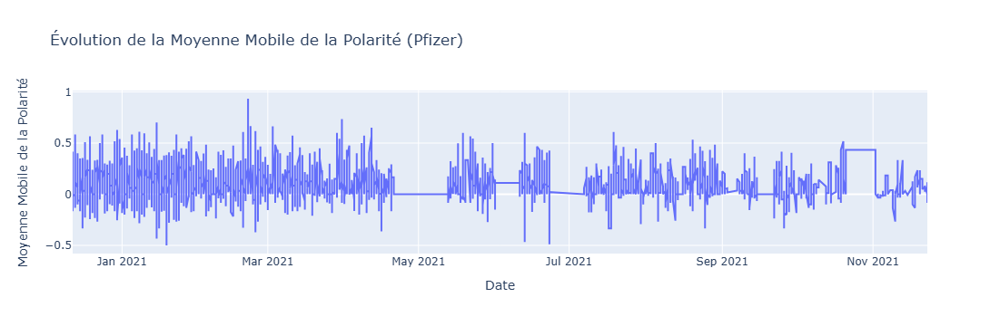

C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\4011864772.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



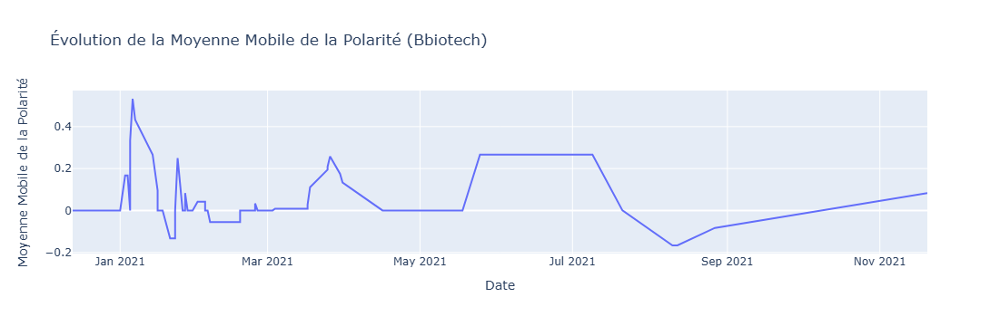

C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\4011864772.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



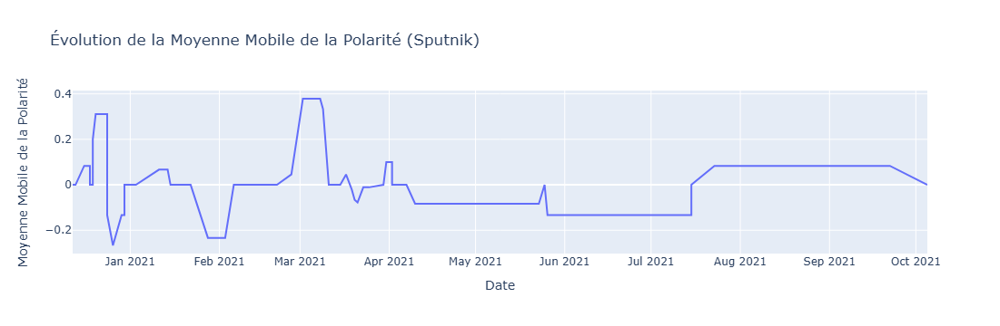

C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\4011864772.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



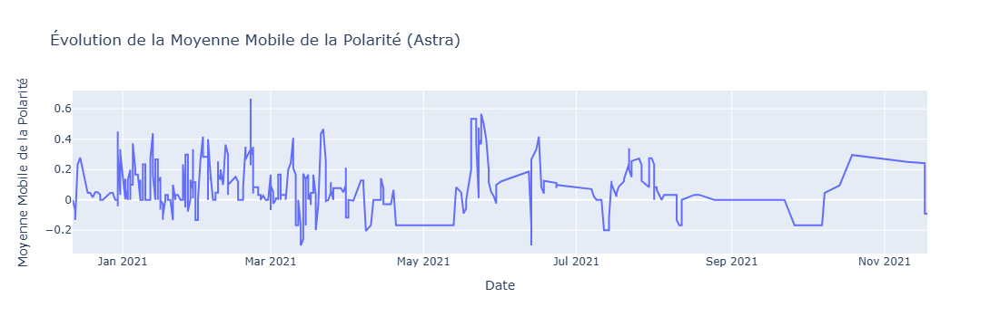

C:\Users\gusta\AppData\Local\Temp\ipykernel_16412\4011864772.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



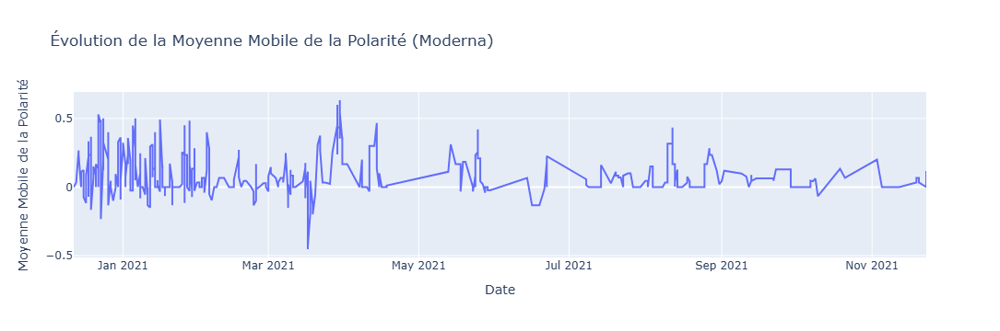

In [92]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Liste des noms de vaccins
vaccine_names = ['pfizer', 'bbiotech', 'sputnik', 'astra', 'moderna']

# Créer un graphique séparé pour chaque vaccin
for vaccine in vaccine_names:
    filtered_df = df[df[vaccine] == 1]  # Filtrer les données pour le vaccin spécifique
    filtered_df['rolling_mean'] = filtered_df['polarity'].rolling(window=3, min_periods=1).mean()  # Calculer la moyenne mobile

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=filtered_df['date'], y=filtered_df['rolling_mean'], name=vaccine.capitalize()))

    fig.update_layout(title=f'Évolution de la Moyenne Mobile de la Polarité ({vaccine.capitalize()})',
                      xaxis=dict(title='Date'),
                      yaxis=dict(title='Moyenne Mobile de la Polarité'))

    fig.show()